In [1]:
# drawing utils
%matplotlib notebook
import matplotlib
from matplotlib import pyplot as plt
from matplotlib import ticker, colors
from matplotlib import animation
# from matplotlib.colors import hsv_to_rgb
# matplotlib.rcParams['text.usetex'] = True
# plt.rcParams.update({
#     "text.usetex": True,
#     "font.family": "sans-serif",
#     "font.sans-serif": ["Arial"]})
# # for Palatino and other serif fonts use:
# plt.rcParams.update({
#     "text.usetex": True,
#     "font.family": "serif",
#     "font.serif": ["Arial"],
# })

from cycler import cycler


# math utils
import numpy as np

# statistics utils
import pandas as pd

# read files
import os

In [2]:
# List files to be processed

suptitle = 'Pump \(360 \mathrm{nm}\) Probe \(1550 \mathrm{cm}^{-1}\)'


# lets load all files

datadir = '../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/'
files = os.listdir(datadir)
files.sort()


meta = []
for file in files:
    if file.endswith('.p.dat'):
        filepath = datadir + file
        a = dict()
        a['filepath'] = filepath
        a['imgtitle'] = file
        meta.append(a)

# meta = [
#     {
#         'filepath':'../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210402.1000.p.dat',
#         'imgtitle':'',
#     },
#     {
#         'filepath':'../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210402.1005.p.dat',
#         'imgtitle':'',
#     },
#     {
#         'filepath':'../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210402.1010.p.dat',
#         'imgtitle':'',
#     },
#     {
#         'filepath':'../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210402.1015.p.dat',
#         'imgtitle':'',
#     },
#     {
#         'filepath':'../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210402.1020.p.dat',
#         'imgtitle':'',
#     },
#     {
#         'filepath':'../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210402.1025.p.dat',
#         'imgtitle':'',
#     },
# ]


In [3]:
# Parse data

def parse_pp_data(filepath):
    print("Processing", filepath)
    rdata = np.loadtxt(filepath)
    # wavenumbers
    vs = rdata[0,1:]
    # wavenumbers
    ts = rdata[1:,0]
    # data points in 2d array
    data = rdata[1:,1:]
    # max and min values from data
    dmax = data.max()
    dmin = data.min()

    # Report data overviews

    print("Raw data has shape", np.shape(rdata))

    with np.printoptions(precision=1, suppress=True):
        print("Found", len(vs), "wavenumbers:", vs)

    with np.printoptions(precision=1, suppress=True):
        print("Found", len(ts), "times:", ts)

    with np.printoptions(precision=1, suppress=True):
        print("Found", data.size, "data points.")
        print("    Max:", dmax)
        print("    Min:", dmin)
    
    return vs, ts, data, dmax, dmin


In [4]:
# # set plot details

# # calculate the number of pictures
# fig, _axs = plt.subplots(nrows=1, ncols=1)
# # fig.subplots_adjust(hspace=0.5)
# ax = _axs.flatten()

# fig.suptitle(suptitle, fontweight='bold')

# images = []

# for i, item in enumerate(meta):
#     filepath = item['filepath']
#     vs, ts, data, dmax, dmin = parse_pp_data(filepath)
#     ax[i].set(xlabel='Wavenumber (cm\(^{-1}\) )', 
#        ylabel='Time (ps)',
#        title= item['imgtitle'])
# #     ax[i].set(xlim=(1600, 1650), ylim=(-10, 50))
#     cbar_step = (dmax-dmin)/100
#     levels = np.arange(dmin, dmax, (dmax-dmin)/100)
#     im = ax[i].contourf(vs, ts, data, levels=levels, cmap='jet')
#     images.append(im)

    
# vmin = min(image.get_array().min() for image in images)
# vmax = max(image.get_array().max() for image in images)
# norm = colors.Normalize(vmin=vmin, vmax=vmax)
# for im in images:
#     im.set_norm(norm)

# fig.colorbar(images[0], ax=ax, orientation='vertical', label='$\mathit\Delta$ O.D.')




Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210402.1000.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    0.1    0.1    0.1    0.2    0.3    0.3    0

<IPython.core.display.Javascript object>


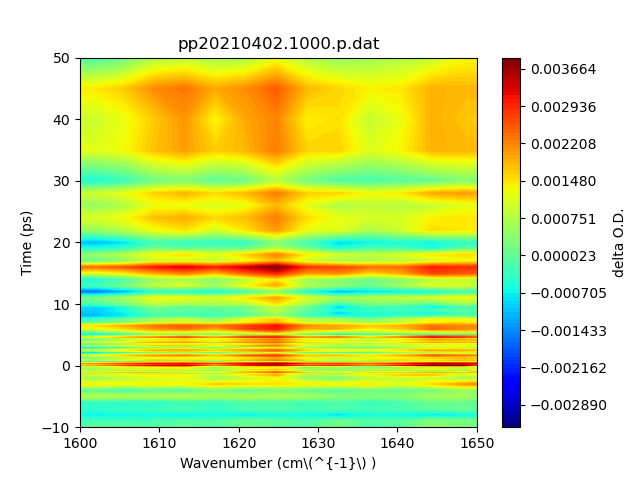

savename: ./temp/pp20210402.1000.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210402.1001.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


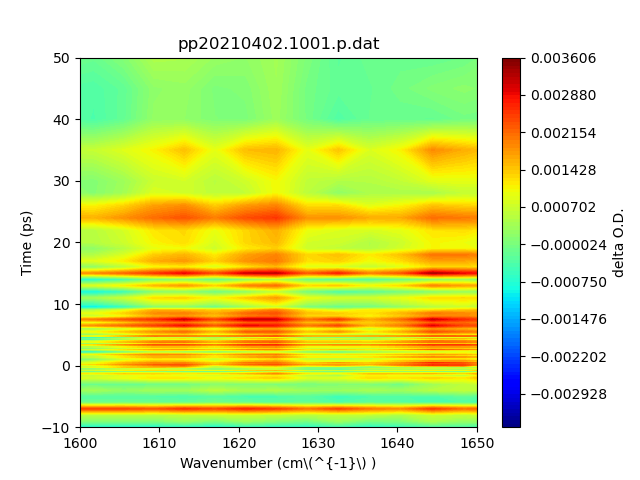

savename: ./temp/pp20210402.1001.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210402.1002.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


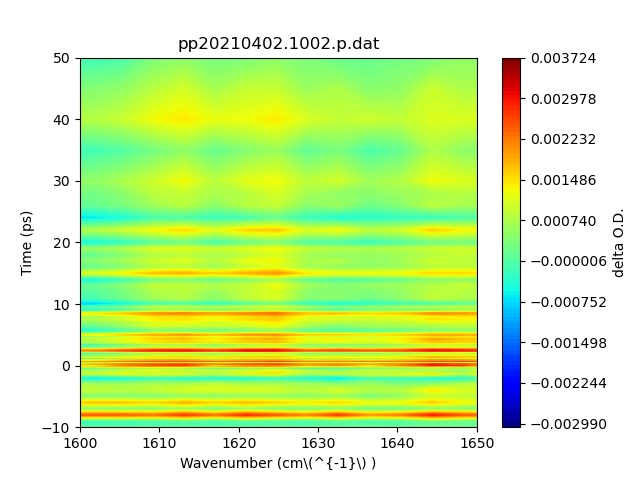

savename: ./temp/pp20210402.1002.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210402.1003.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


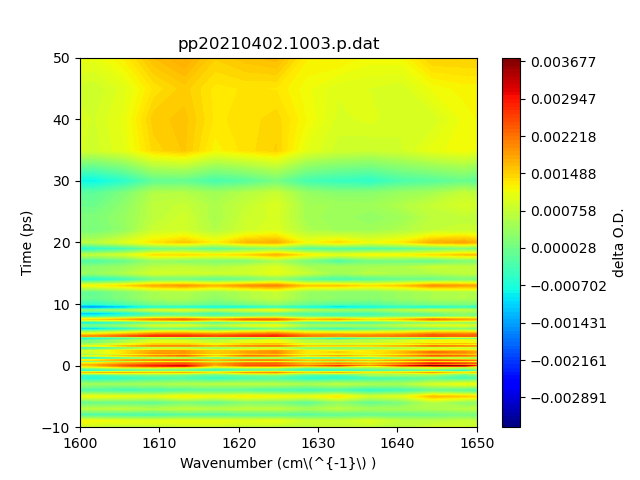

savename: ./temp/pp20210402.1003.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210402.1004.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


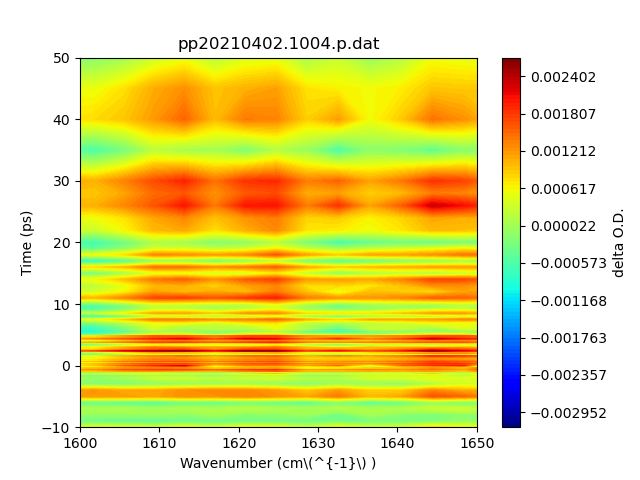

savename: ./temp/pp20210402.1004.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210402.1005.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


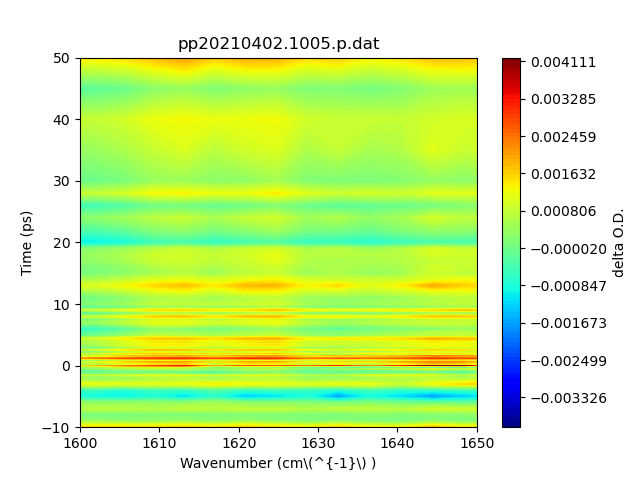

savename: ./temp/pp20210402.1005.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210402.1006.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


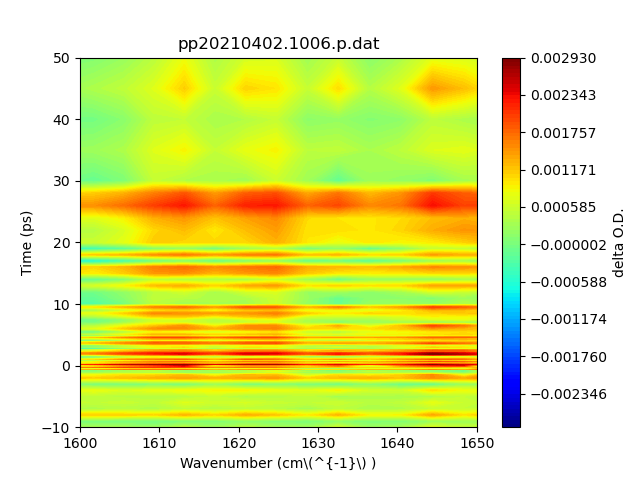

savename: ./temp/pp20210402.1006.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210402.1007.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


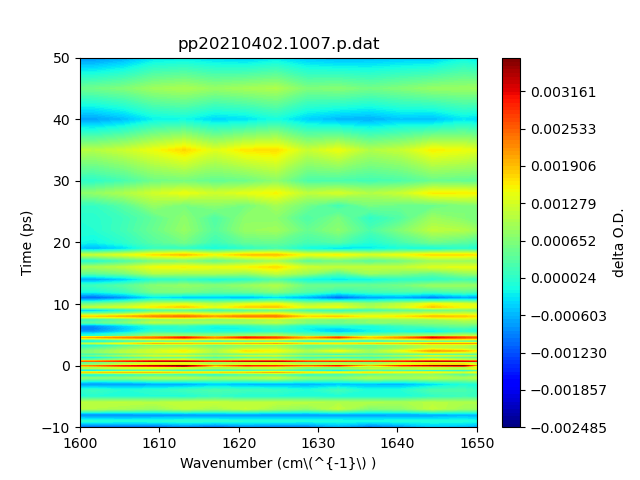

savename: ./temp/pp20210402.1007.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210402.1008.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


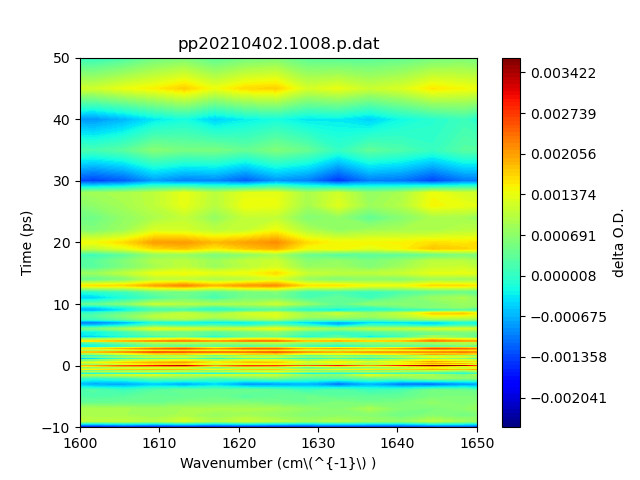

savename: ./temp/pp20210402.1008.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210402.1009.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


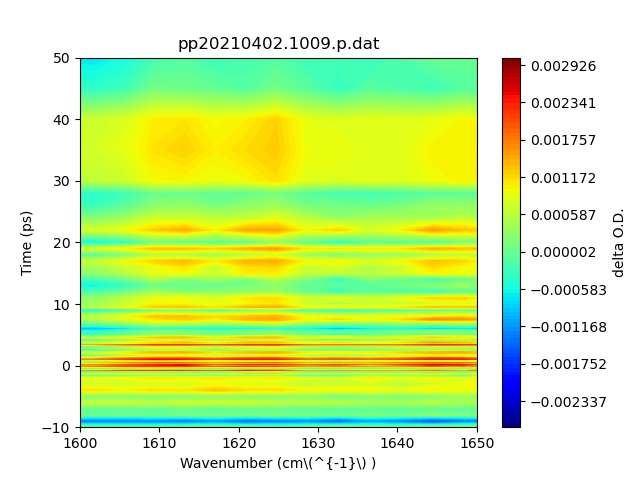

savename: ./temp/pp20210402.1009.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210402.1010.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


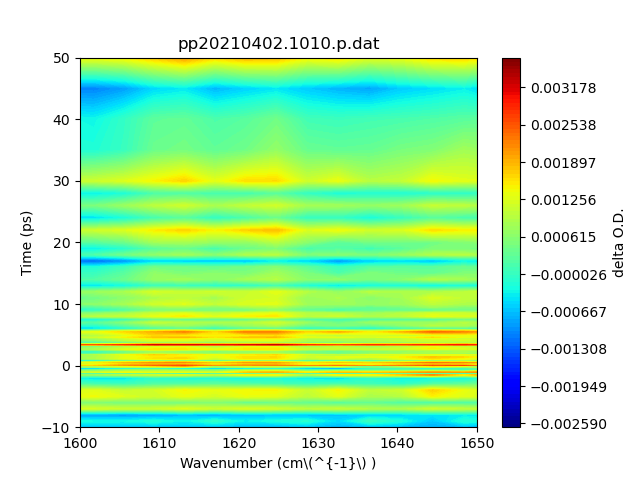

savename: ./temp/pp20210402.1010.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210402.1011.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


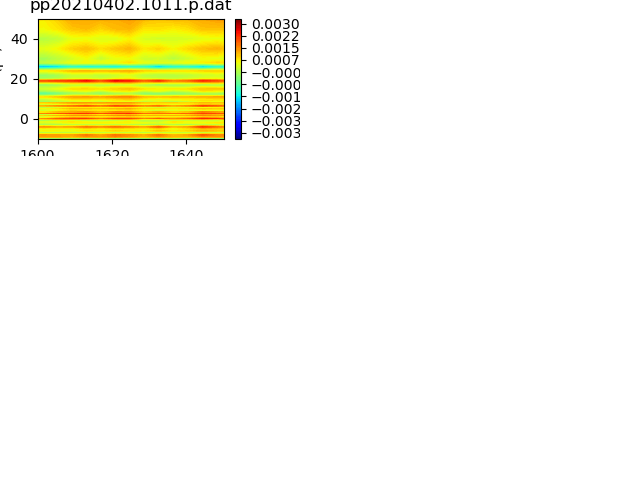

savename: ./temp/pp20210402.1011.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210402.1012.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


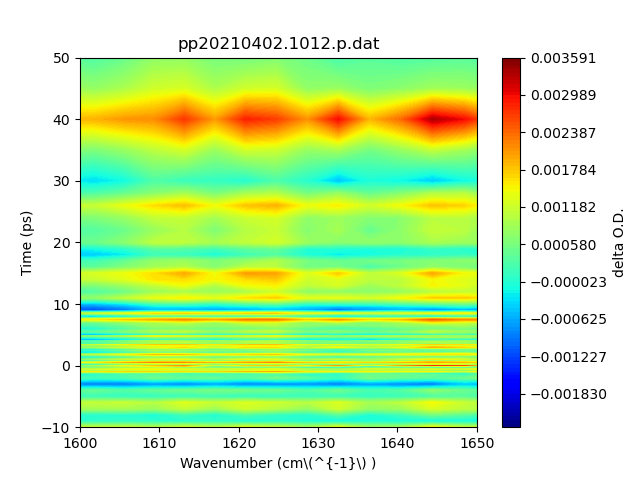

savename: ./temp/pp20210402.1012.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210402.1013.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


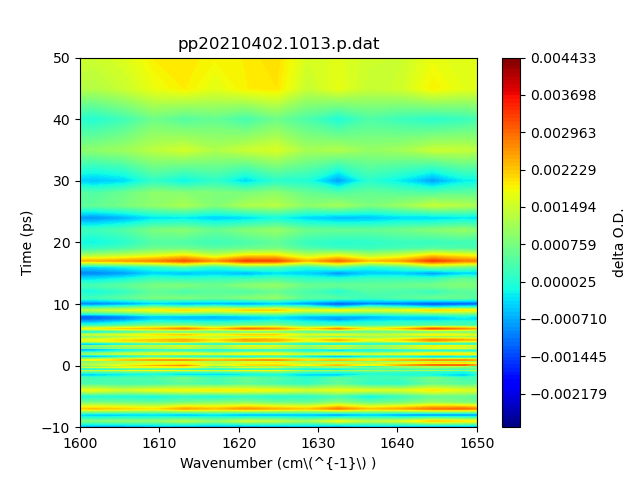

savename: ./temp/pp20210402.1013.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210402.1014.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


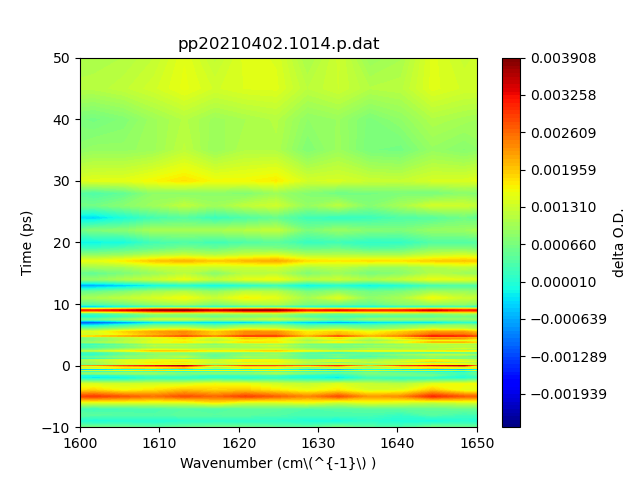

savename: ./temp/pp20210402.1014.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210402.1015.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


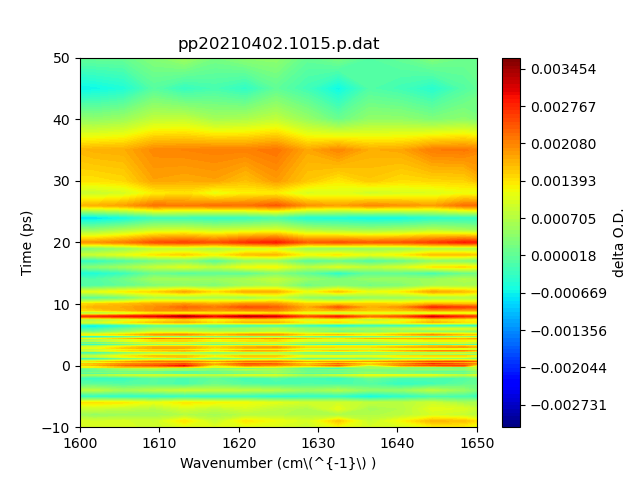

savename: ./temp/pp20210402.1015.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210402.1016.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


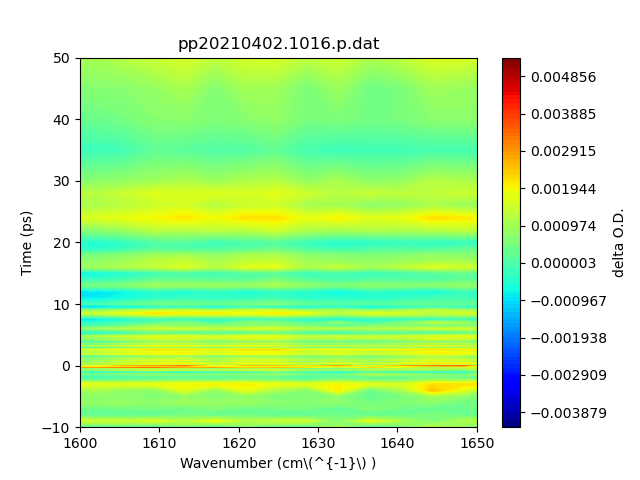

savename: ./temp/pp20210402.1016.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210402.1017.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


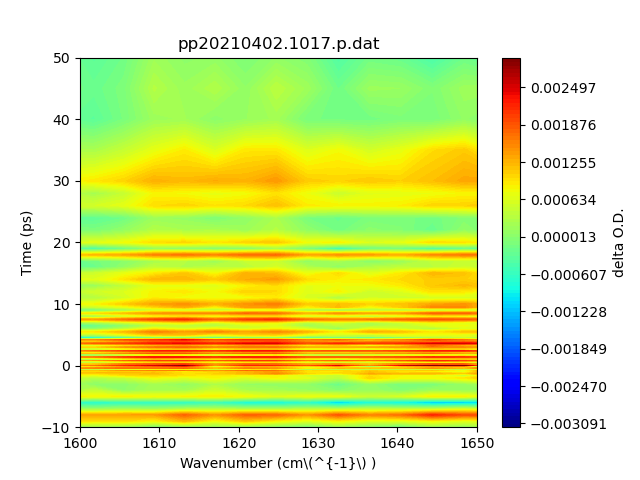

savename: ./temp/pp20210402.1017.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210402.1018.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


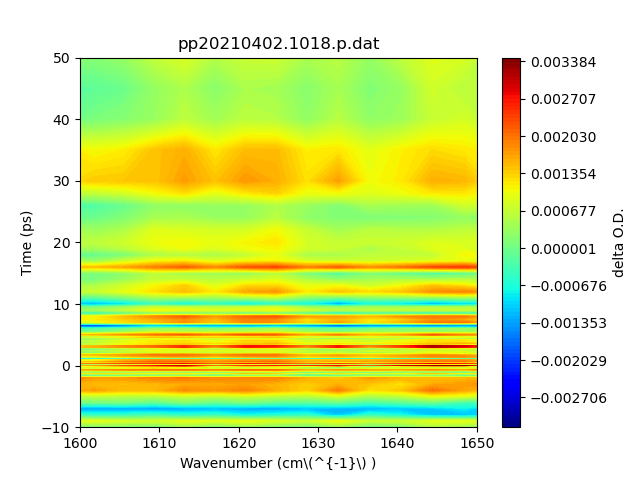

savename: ./temp/pp20210402.1018.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210402.1019.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


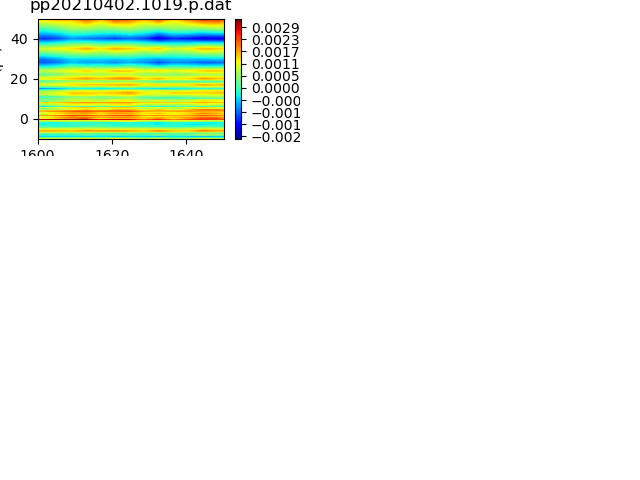

savename: ./temp/pp20210402.1019.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210402.1020.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<ipython-input-5-b226fcf3b8ac>:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


<IPython.core.display.Javascript object>


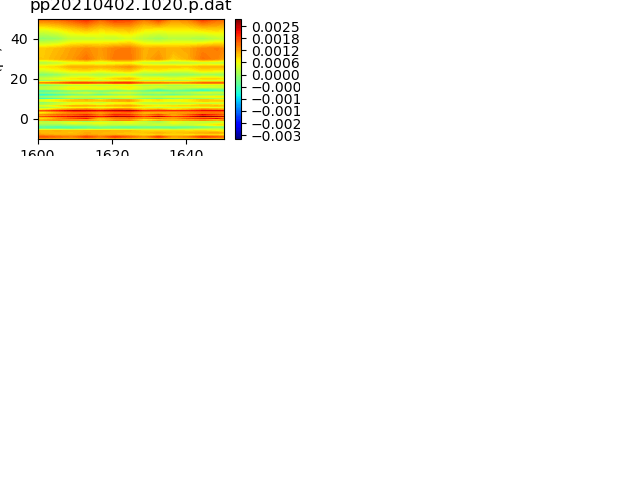

savename: ./temp/pp20210402.1020.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210402.1021.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


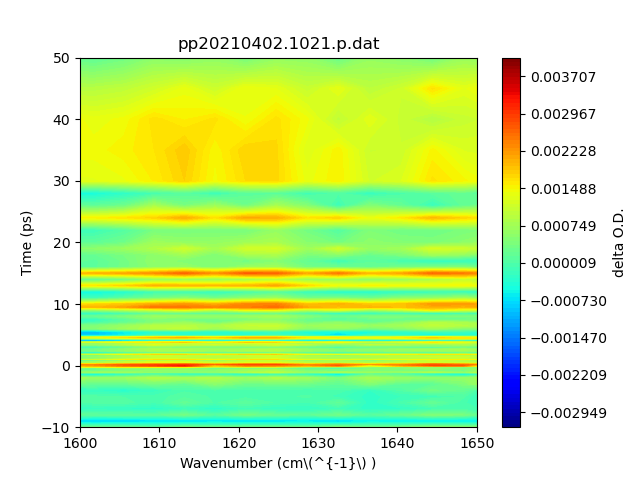

savename: ./temp/pp20210402.1021.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210402.1022.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210402.1022.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210402.1023.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210402.1023.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210402.1024.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


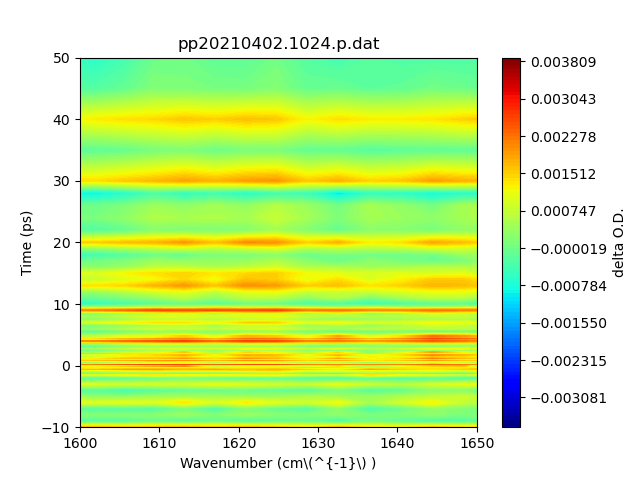

savename: ./temp/pp20210402.1024.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210402.1025.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210402.1025.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1000.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


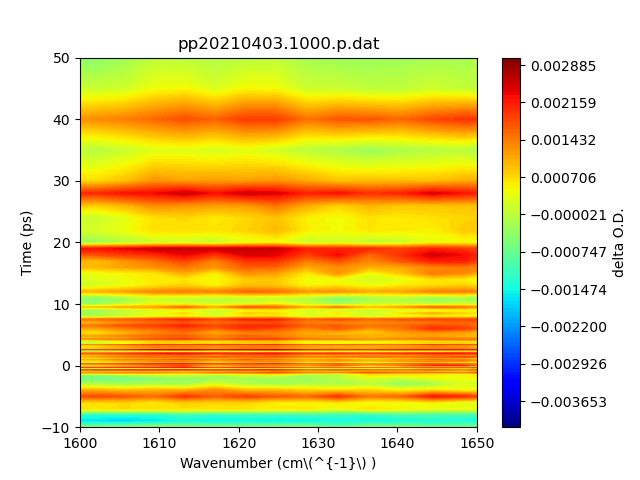

savename: ./temp/pp20210403.1000.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1001.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


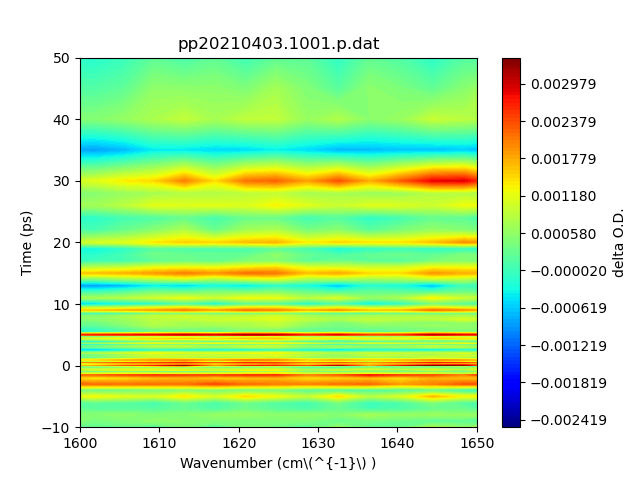

savename: ./temp/pp20210403.1001.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1002.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1002.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1003.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1003.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1004.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


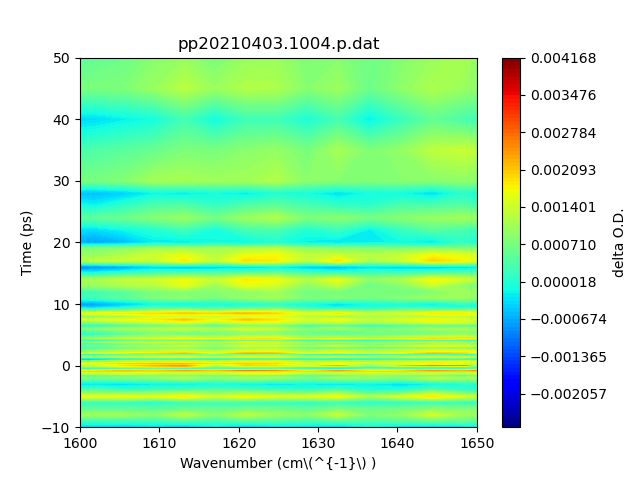

savename: ./temp/pp20210403.1004.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1005.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


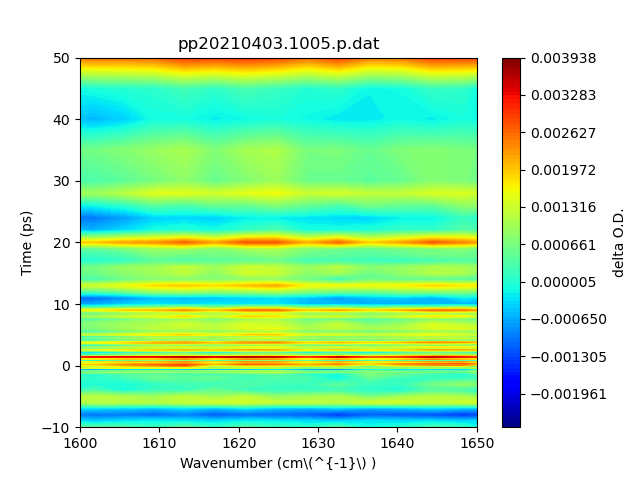

savename: ./temp/pp20210403.1005.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1006.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


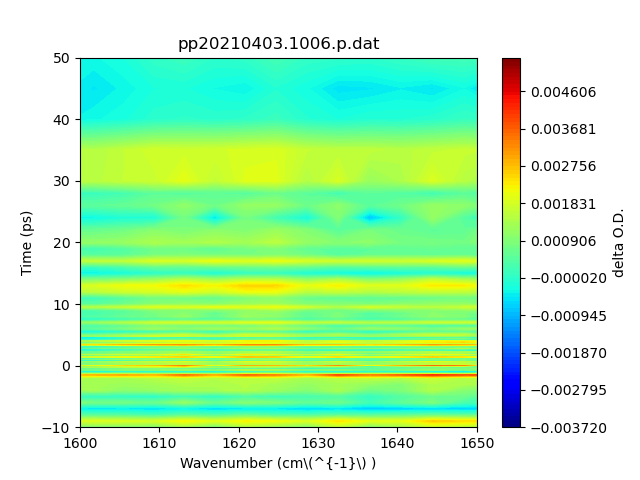

savename: ./temp/pp20210403.1006.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1007.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1007.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1008.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


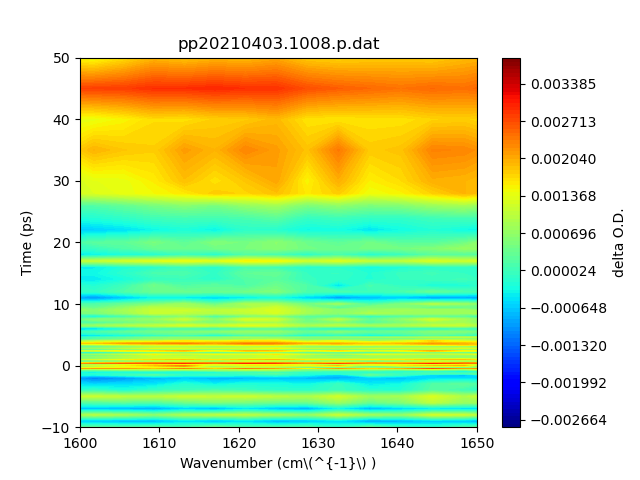

savename: ./temp/pp20210403.1008.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1009.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


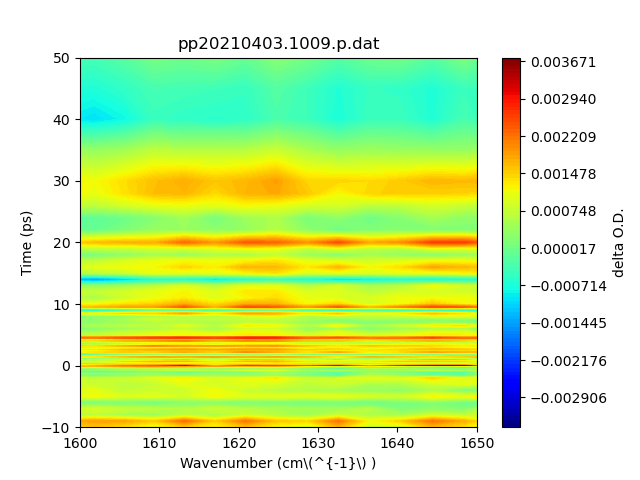

savename: ./temp/pp20210403.1009.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1010.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


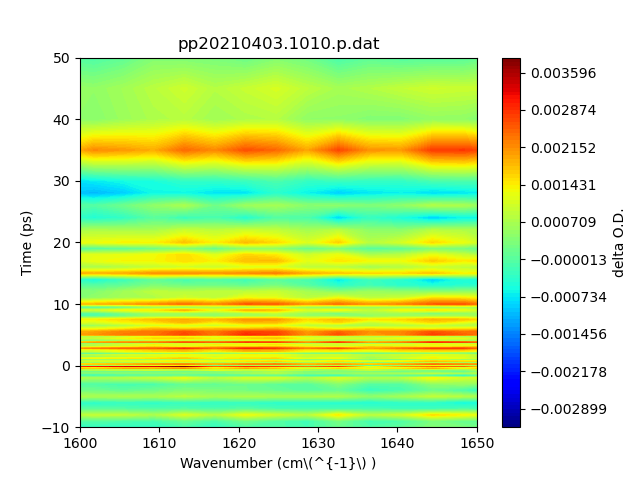

savename: ./temp/pp20210403.1010.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1011.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1011.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1012.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1012.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1013.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


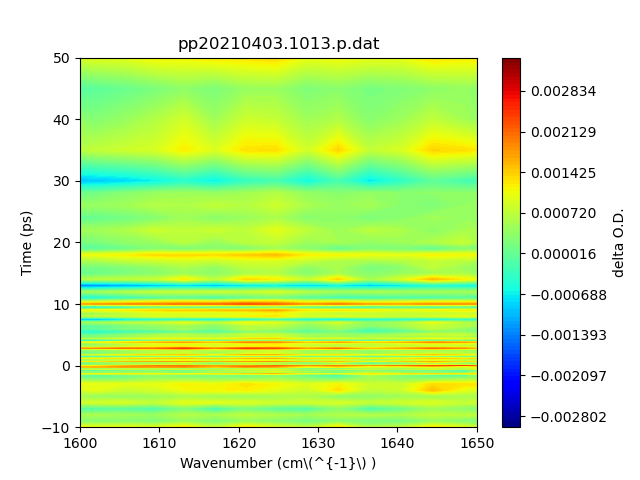

savename: ./temp/pp20210403.1013.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1014.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


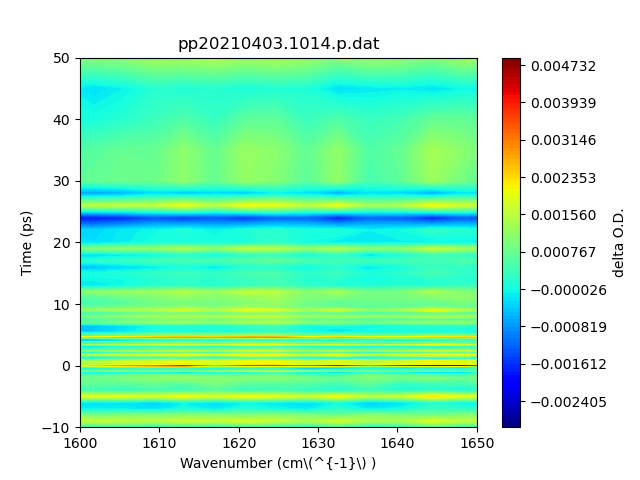

savename: ./temp/pp20210403.1014.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1015.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1015.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1016.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1016.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1017.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


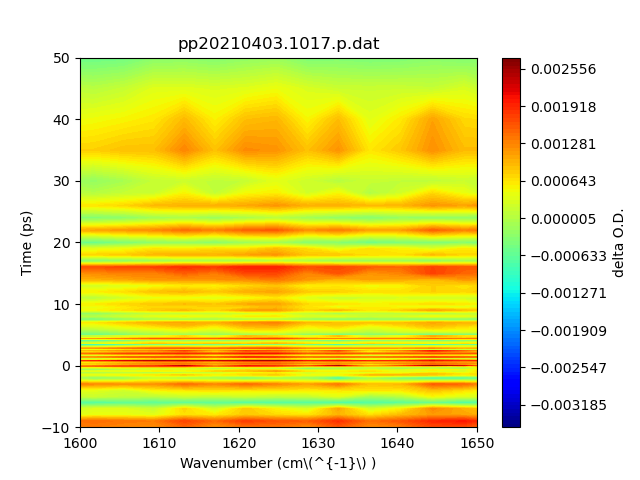

savename: ./temp/pp20210403.1017.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1018.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


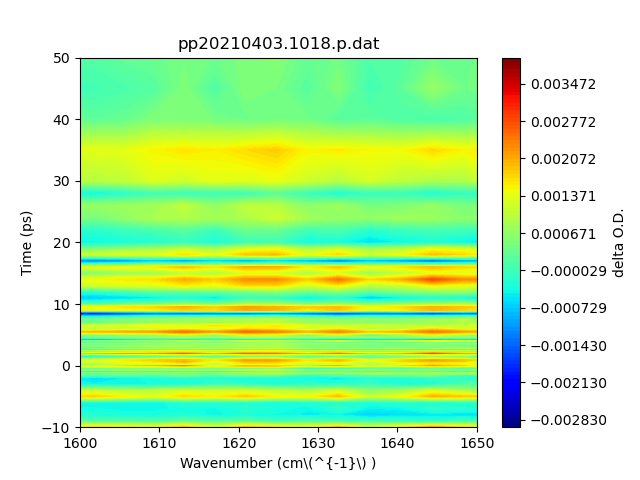

savename: ./temp/pp20210403.1018.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1019.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


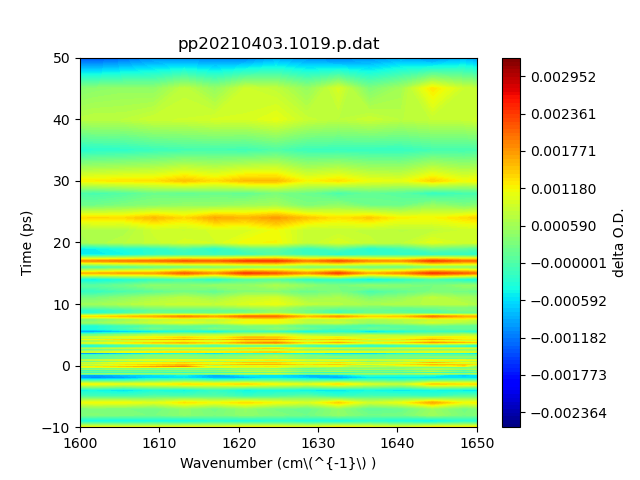

savename: ./temp/pp20210403.1019.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1020.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1020.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1021.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


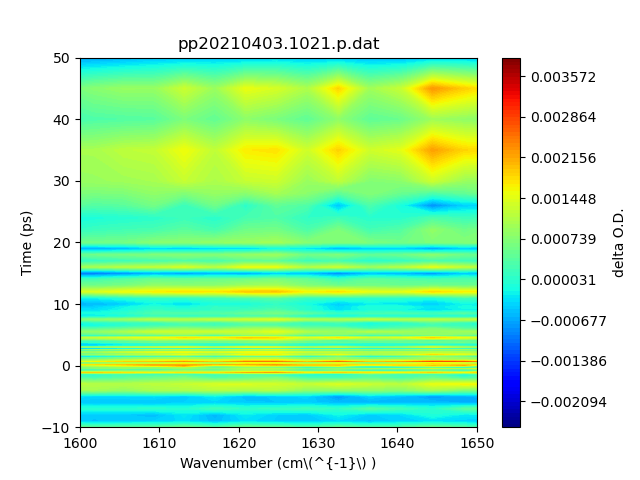

savename: ./temp/pp20210403.1021.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1022.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


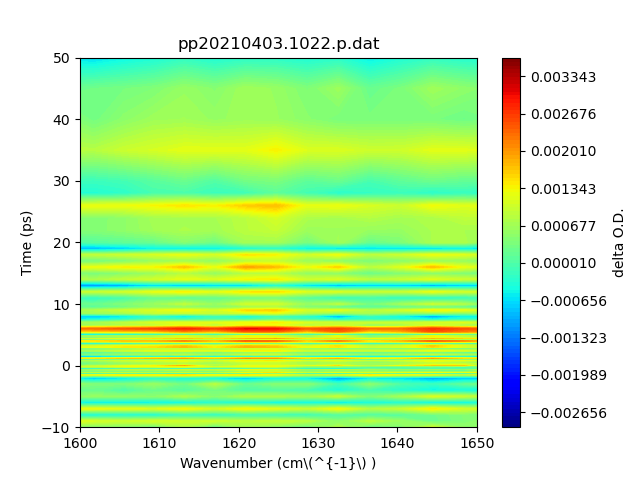

savename: ./temp/pp20210403.1022.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1023.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


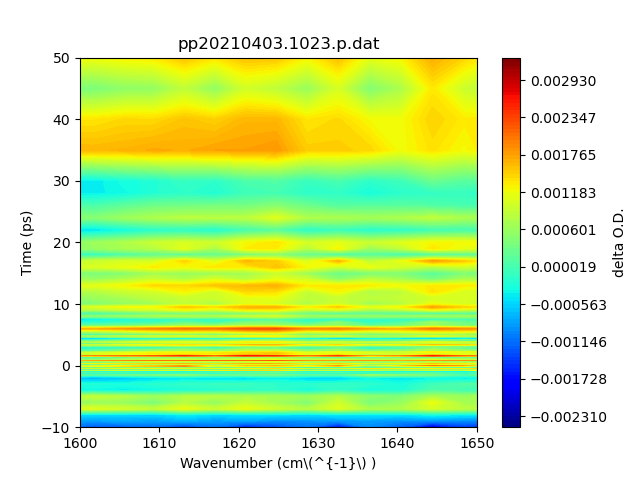

savename: ./temp/pp20210403.1023.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1024.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1024.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1025.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1025.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1026.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


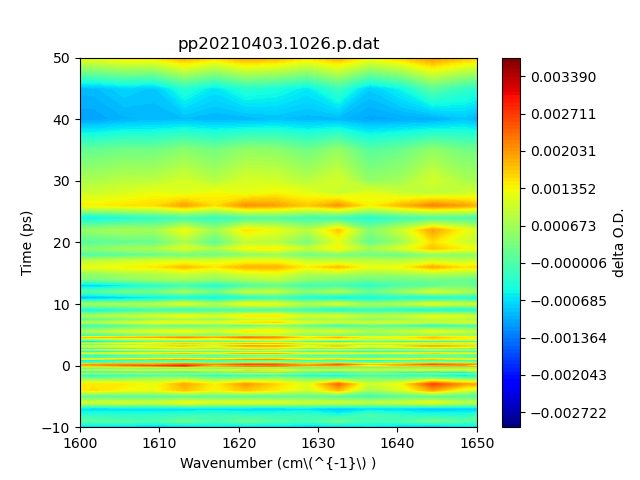

savename: ./temp/pp20210403.1026.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1027.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


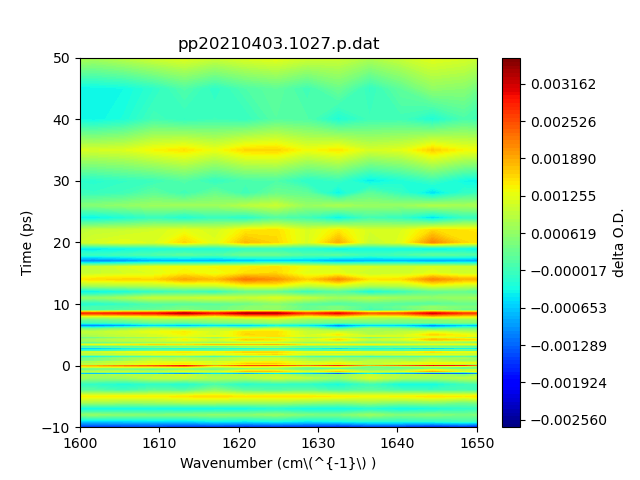

savename: ./temp/pp20210403.1027.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1028.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1028.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1029.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1029.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1030.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1030.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1031.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


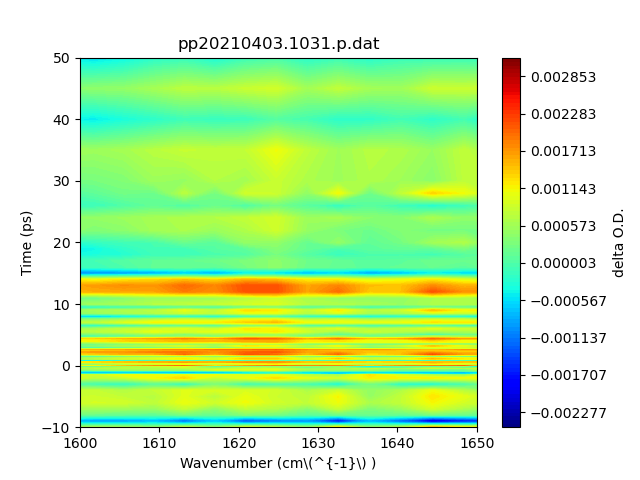

savename: ./temp/pp20210403.1031.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1032.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


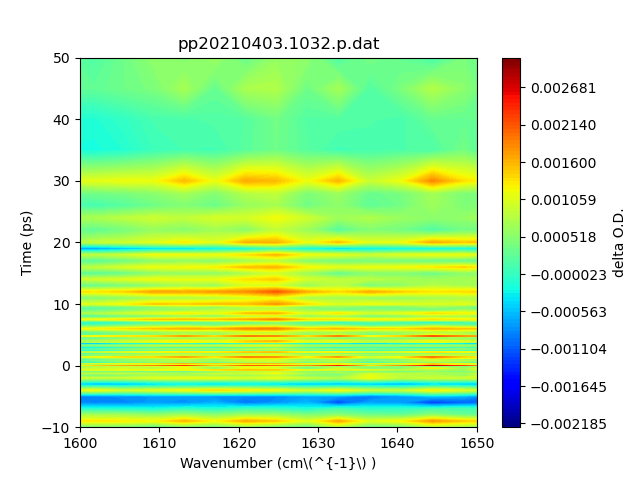

savename: ./temp/pp20210403.1032.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1033.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1033.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1034.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


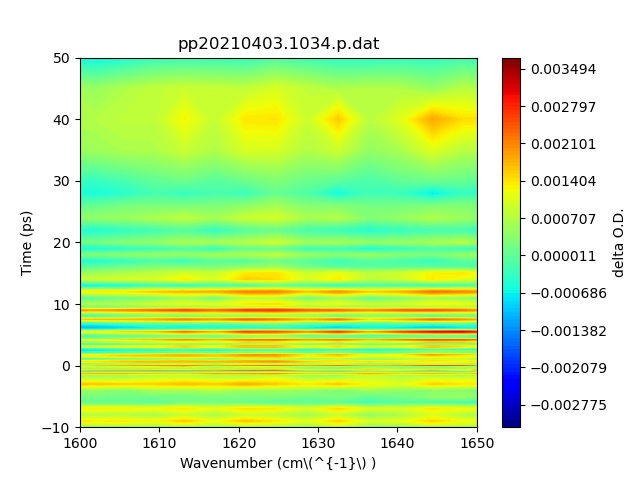

savename: ./temp/pp20210403.1034.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1035.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


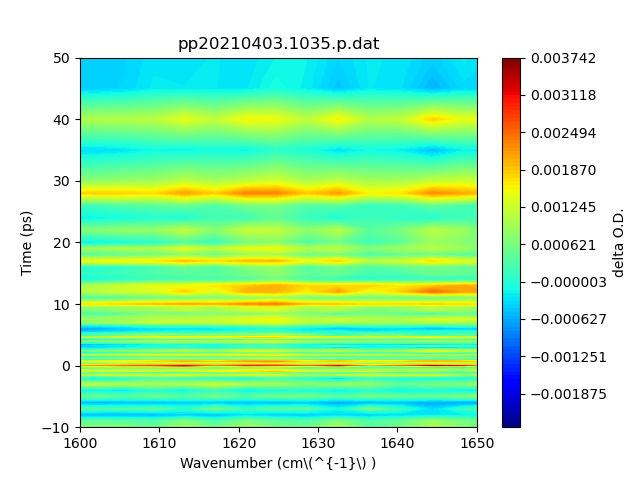

savename: ./temp/pp20210403.1035.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1036.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


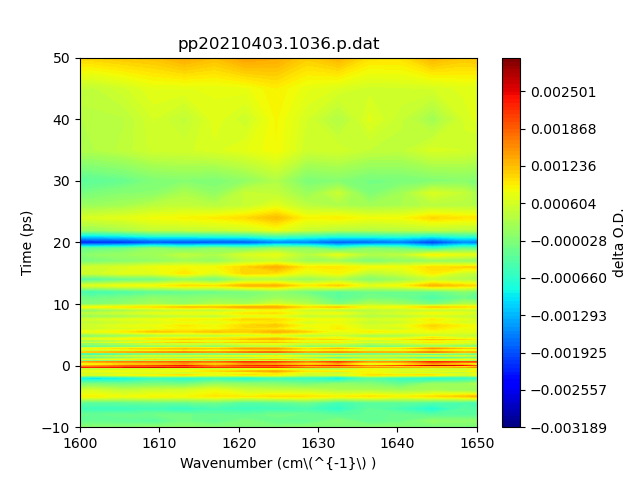

savename: ./temp/pp20210403.1036.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1037.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1037.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1038.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1038.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1039.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


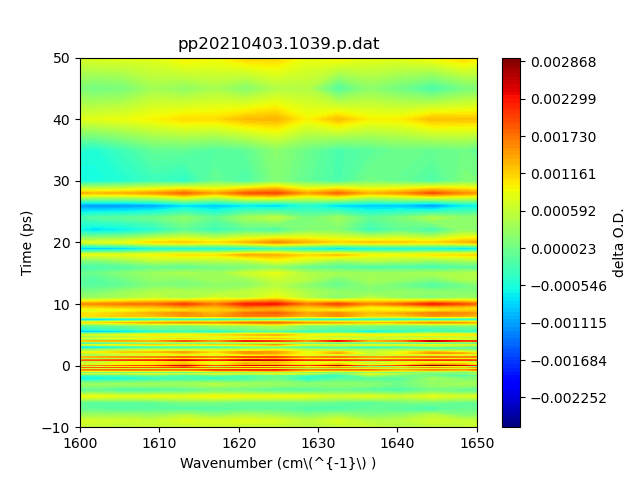

savename: ./temp/pp20210403.1039.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1040.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


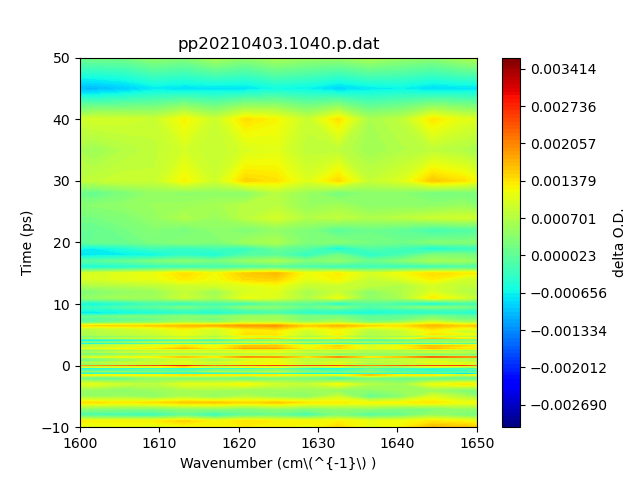

savename: ./temp/pp20210403.1040.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1041.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1041.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1042.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1042.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1043.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1043.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1044.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


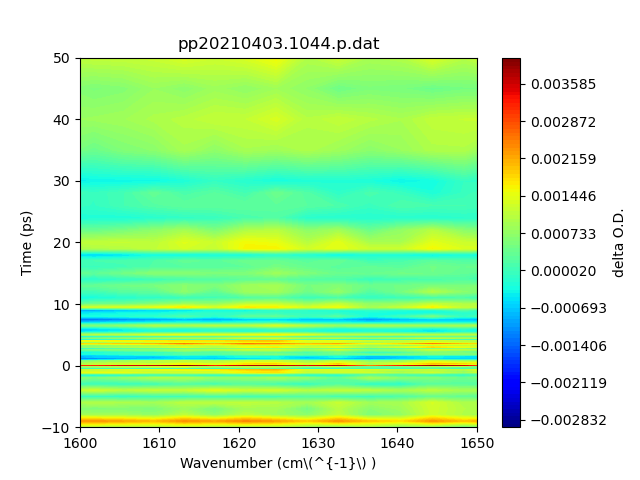

savename: ./temp/pp20210403.1044.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1045.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


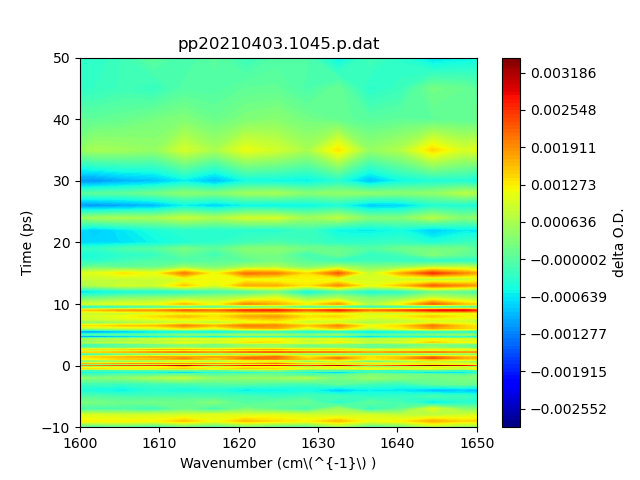

savename: ./temp/pp20210403.1045.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1046.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1046.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1047.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1047.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1048.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


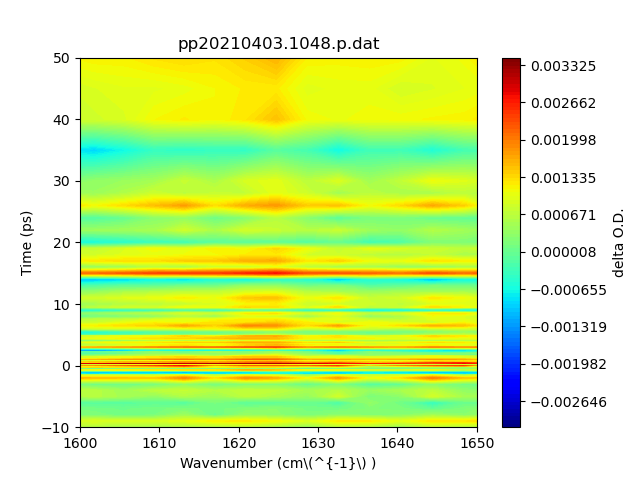

savename: ./temp/pp20210403.1048.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1049.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


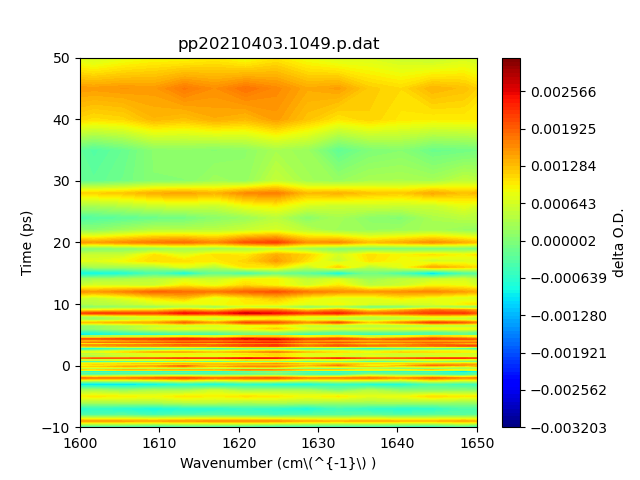

savename: ./temp/pp20210403.1049.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1050.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1050.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1051.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


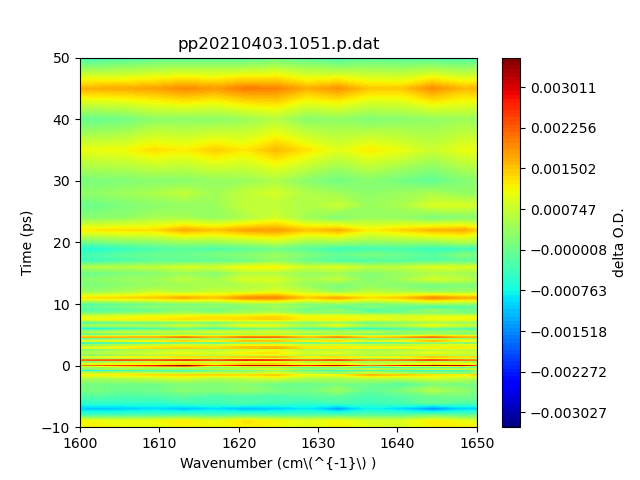

savename: ./temp/pp20210403.1051.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1052.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


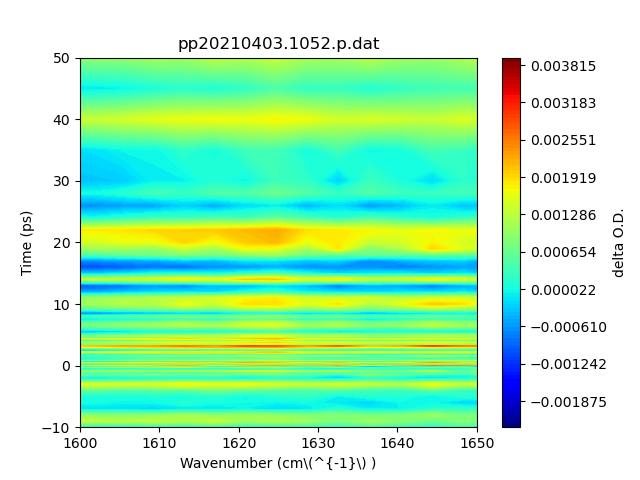

savename: ./temp/pp20210403.1052.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1053.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


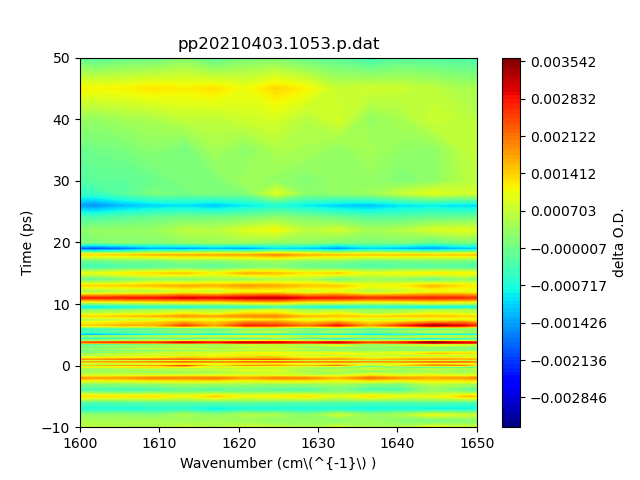

savename: ./temp/pp20210403.1053.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1054.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1054.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1055.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


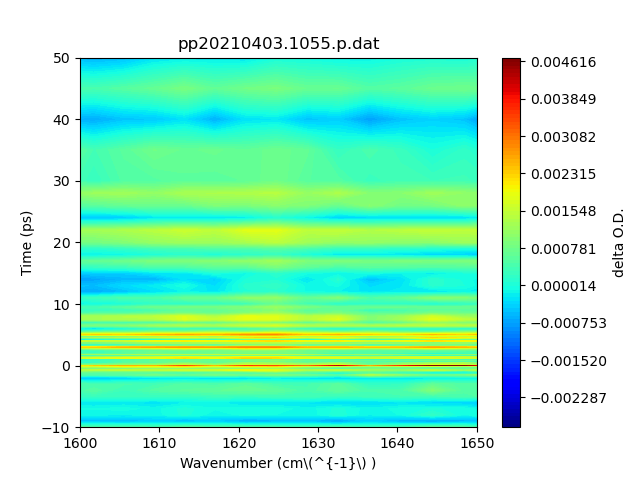

savename: ./temp/pp20210403.1055.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1056.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


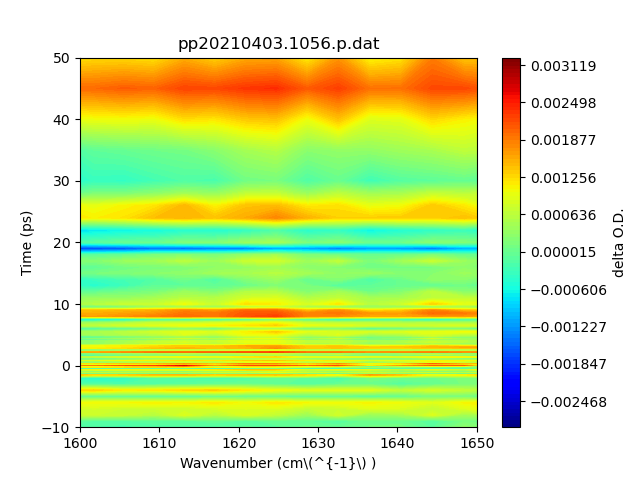

savename: ./temp/pp20210403.1056.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1057.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


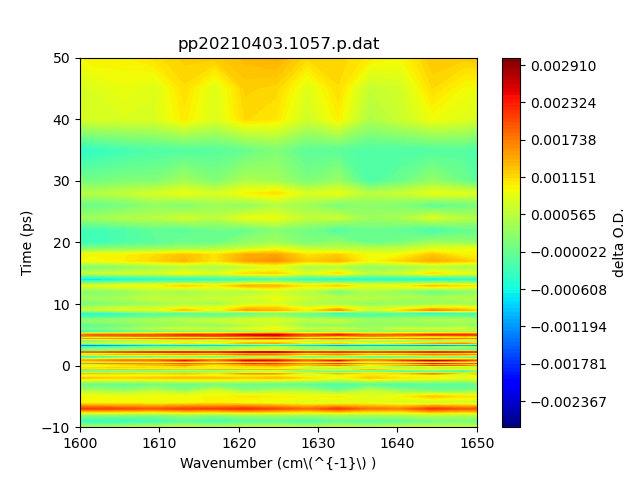

savename: ./temp/pp20210403.1057.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1058.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1058.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1059.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1059.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1060.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


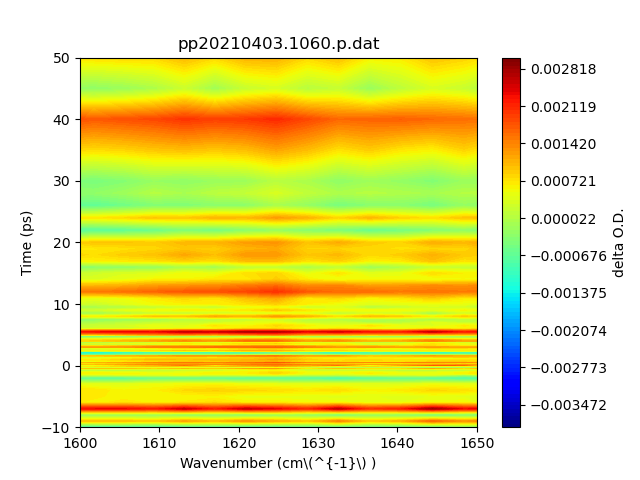

savename: ./temp/pp20210403.1060.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1061.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1061.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1062.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1062.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1063.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1063.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1064.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


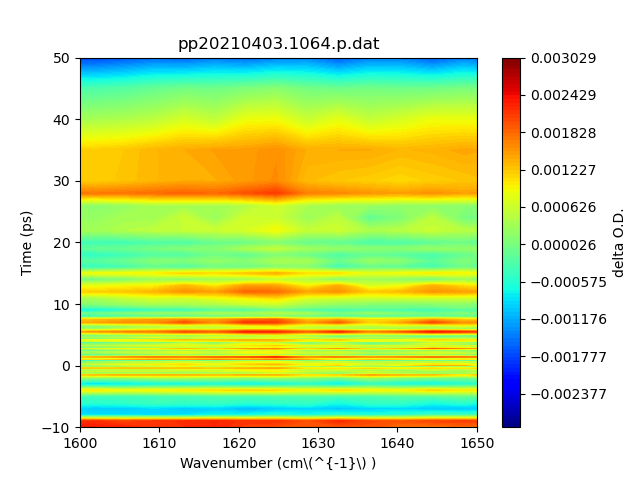

savename: ./temp/pp20210403.1064.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1065.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


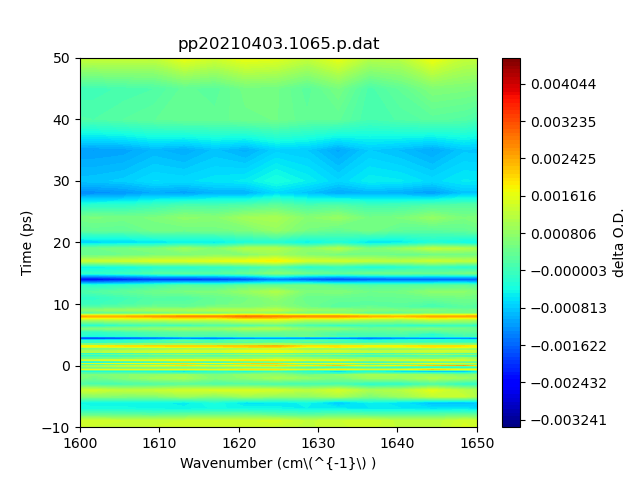

savename: ./temp/pp20210403.1065.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1066.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


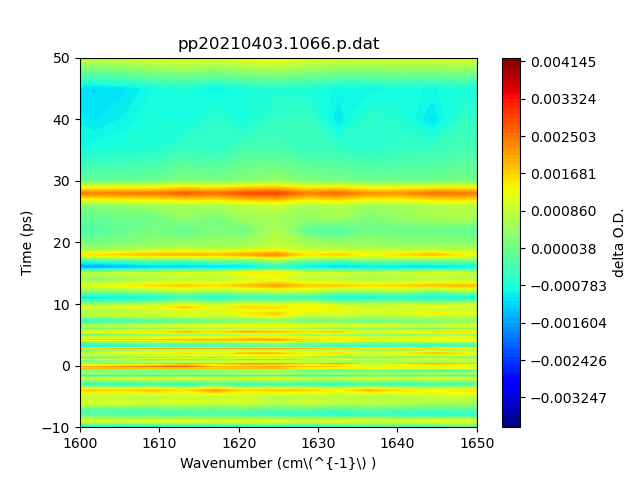

savename: ./temp/pp20210403.1066.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1067.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1067.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1068.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


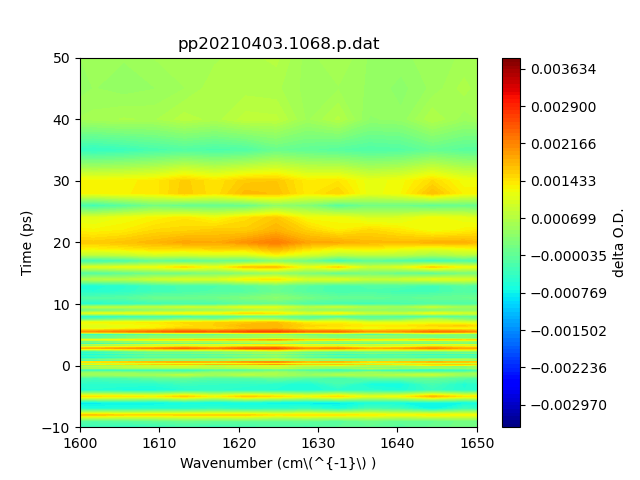

savename: ./temp/pp20210403.1068.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1069.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


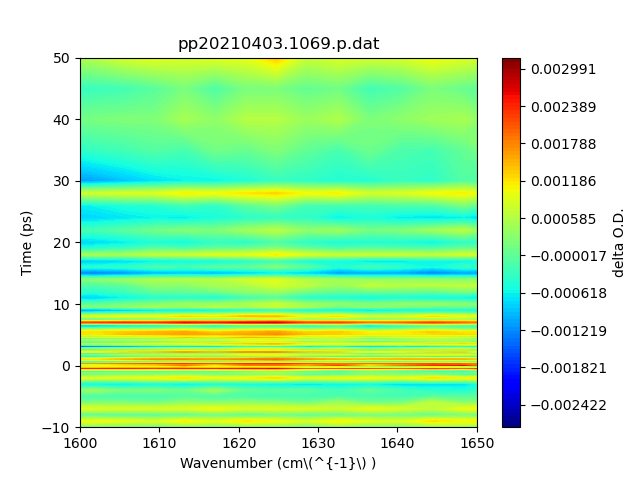

savename: ./temp/pp20210403.1069.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1070.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1070.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1071.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1071.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1072.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1072.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1073.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


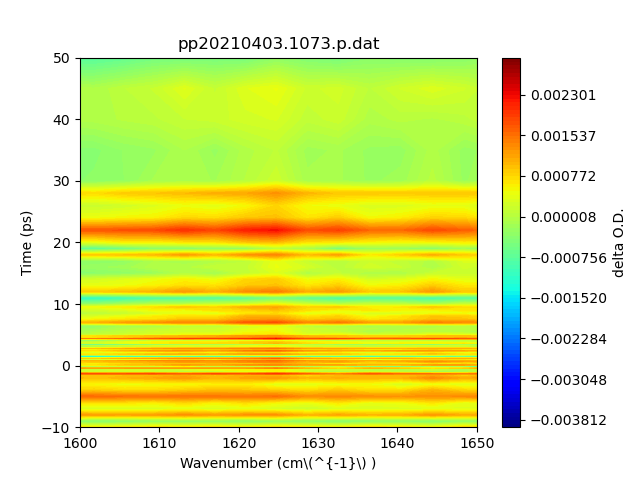

savename: ./temp/pp20210403.1073.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1074.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1074.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1075.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1075.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1076.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


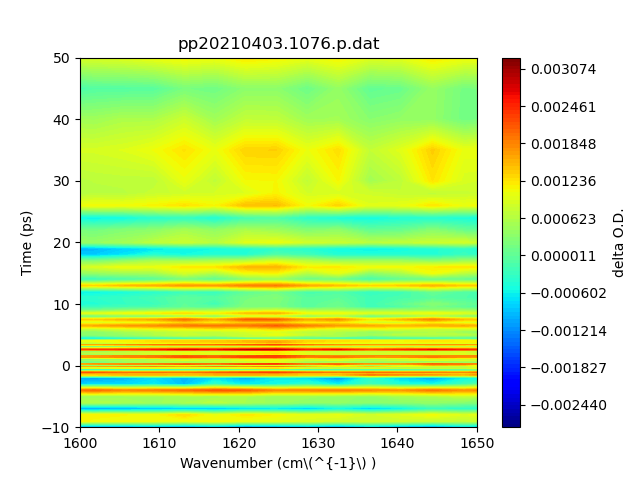

savename: ./temp/pp20210403.1076.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1077.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1077.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1078.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1078.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1079.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1079.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1080.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1080.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1081.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1081.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1082.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1082.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1083.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


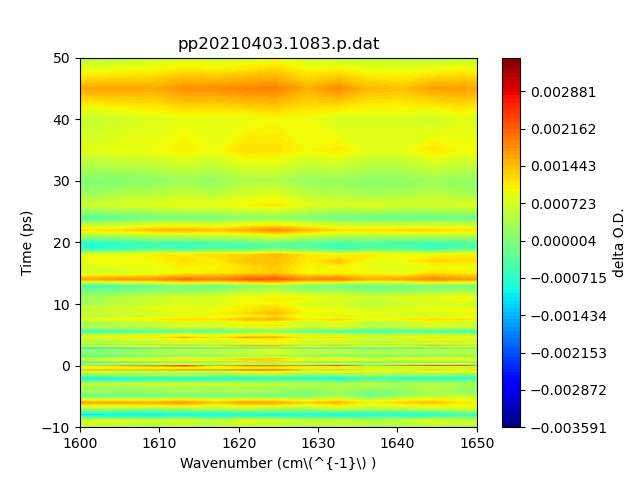

savename: ./temp/pp20210403.1083.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1084.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1084.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1085.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


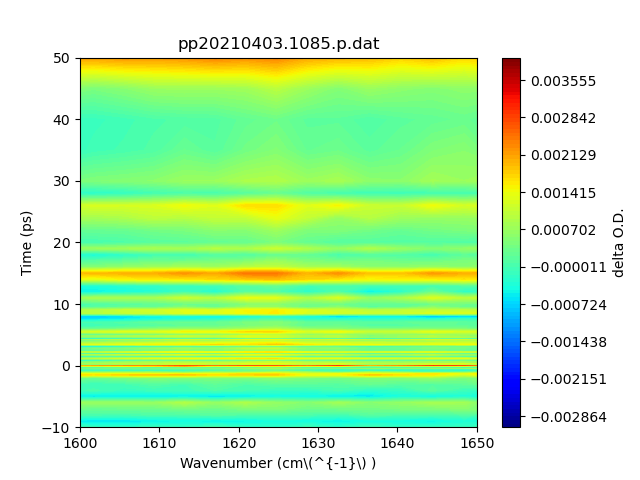

savename: ./temp/pp20210403.1085.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1086.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1086.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1087.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


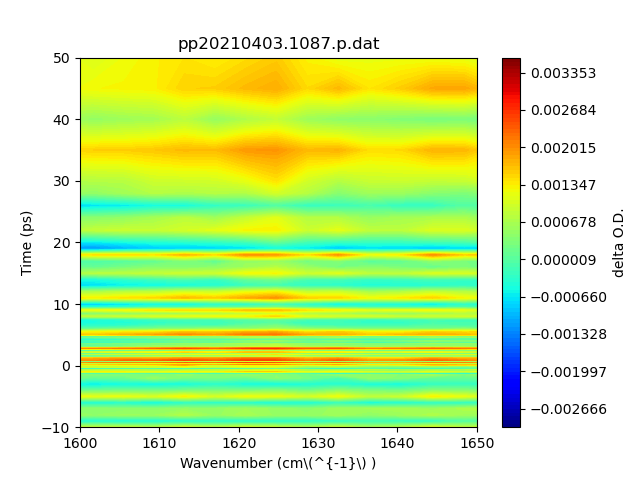

savename: ./temp/pp20210403.1087.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1088.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1088.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1089.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


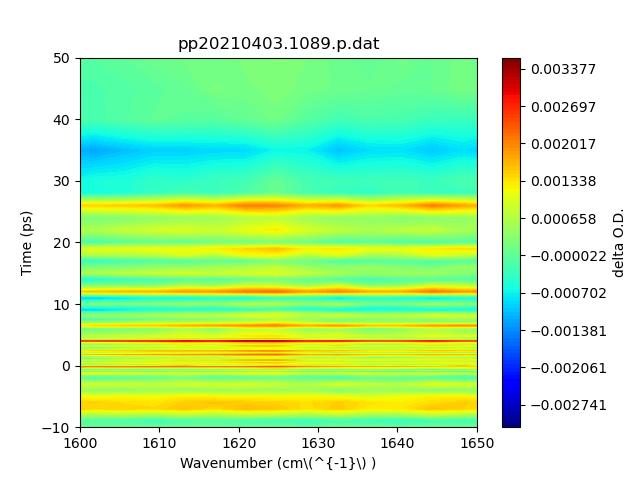

savename: ./temp/pp20210403.1089.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1090.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


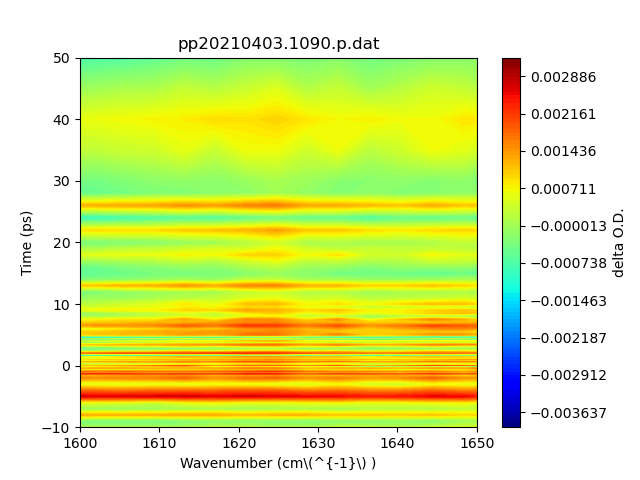

savename: ./temp/pp20210403.1090.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1091.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1091.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1092.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


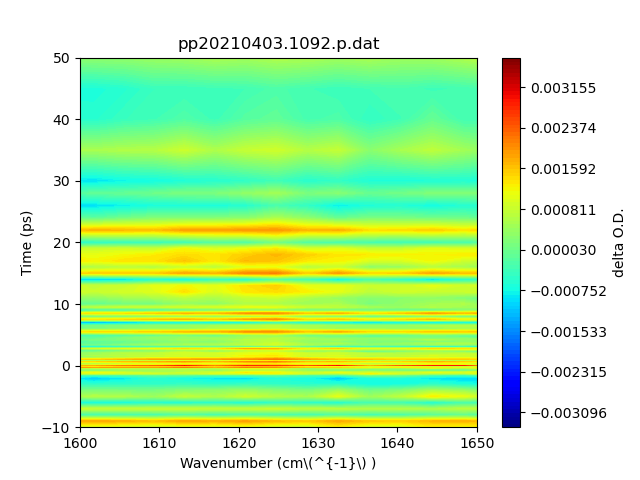

savename: ./temp/pp20210403.1092.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1093.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


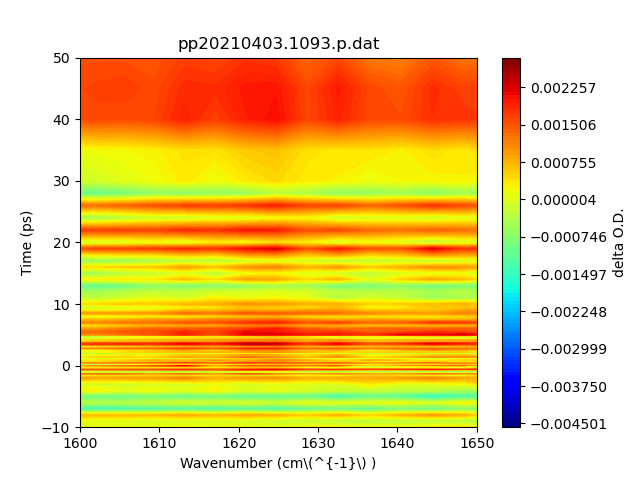

savename: ./temp/pp20210403.1093.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1094.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


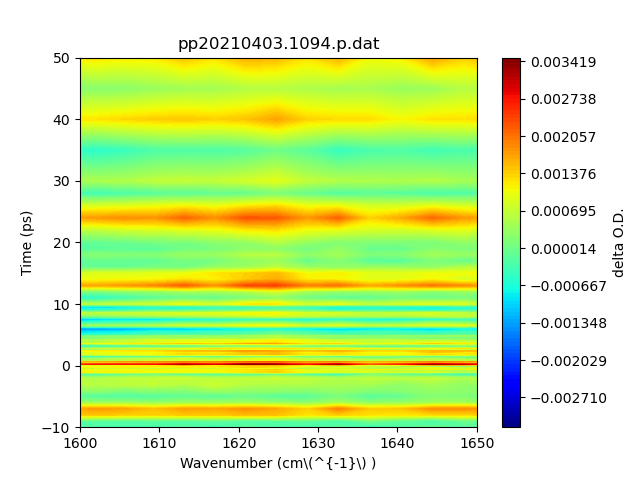

savename: ./temp/pp20210403.1094.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1095.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


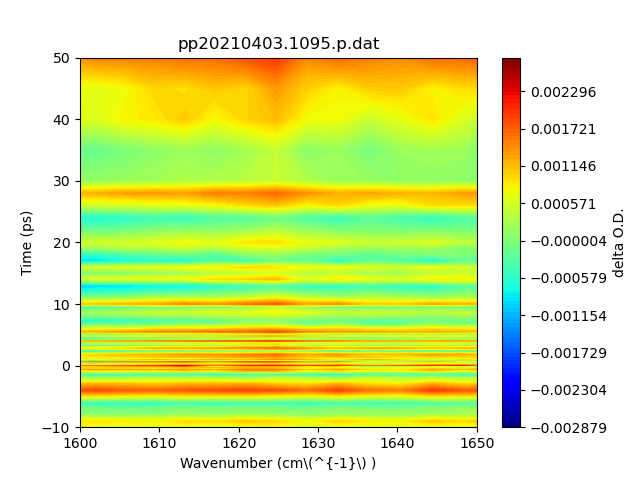

savename: ./temp/pp20210403.1095.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1096.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1096.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1097.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


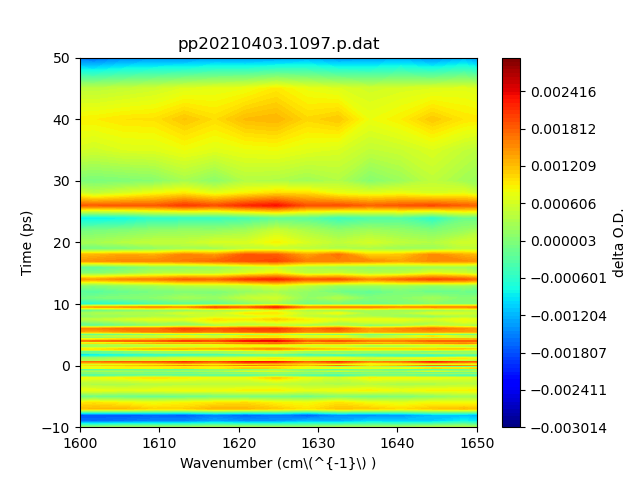

savename: ./temp/pp20210403.1097.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1098.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1098.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1099.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


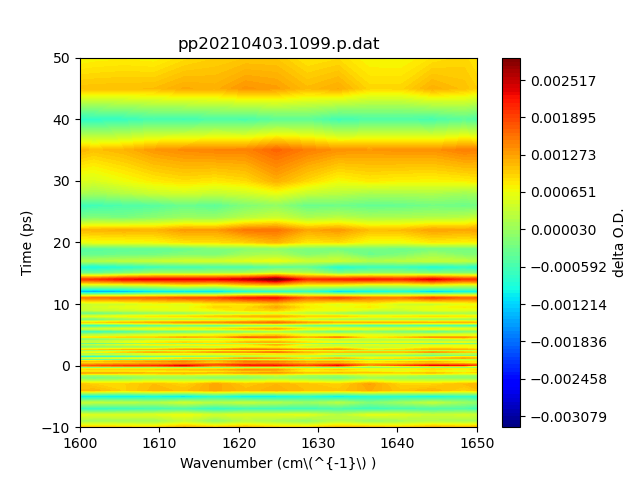

savename: ./temp/pp20210403.1099.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1100.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1100.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1101.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


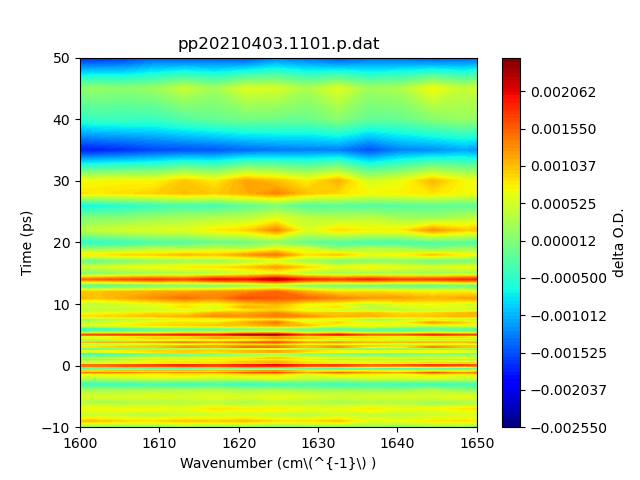

savename: ./temp/pp20210403.1101.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1102.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


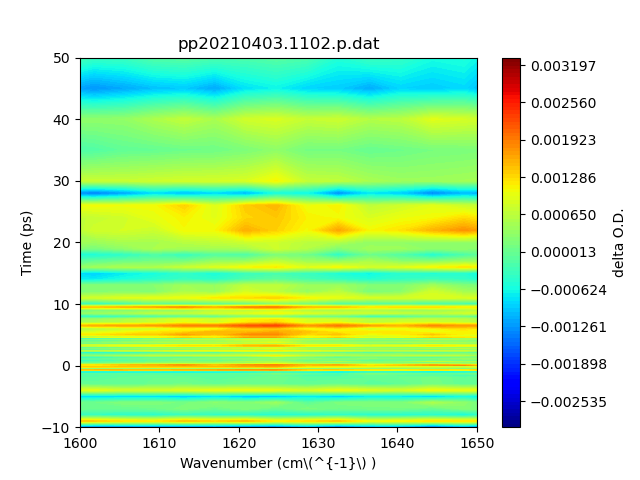

savename: ./temp/pp20210403.1102.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1103.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


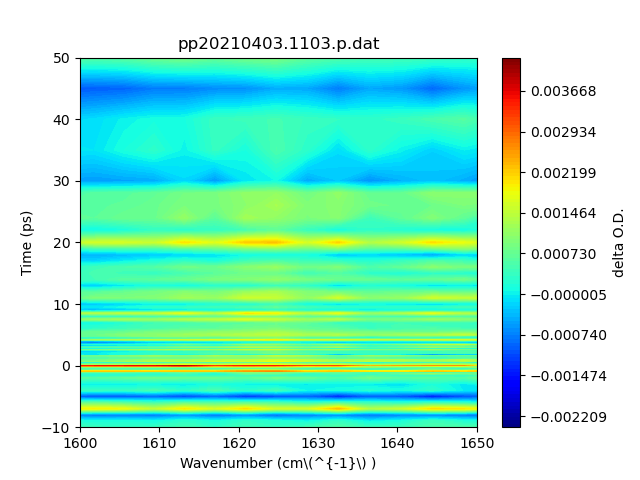

savename: ./temp/pp20210403.1103.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1104.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1104.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1105.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1105.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1106.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


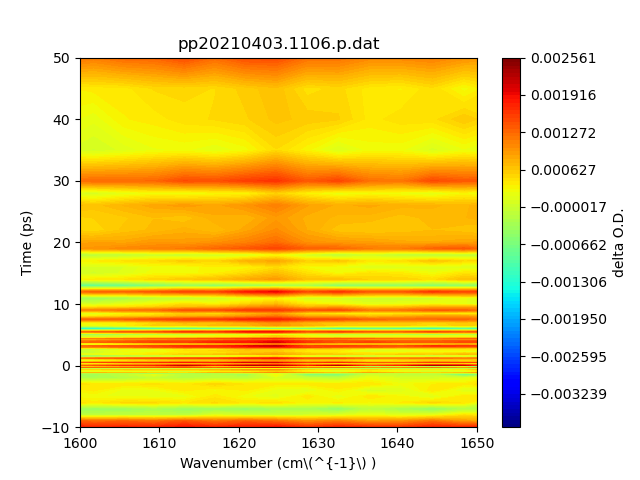

savename: ./temp/pp20210403.1106.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1107.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1107.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1108.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1108.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1109.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


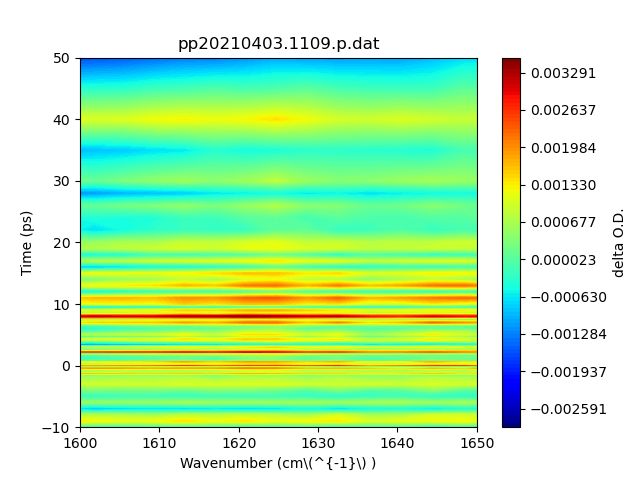

savename: ./temp/pp20210403.1109.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1110.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


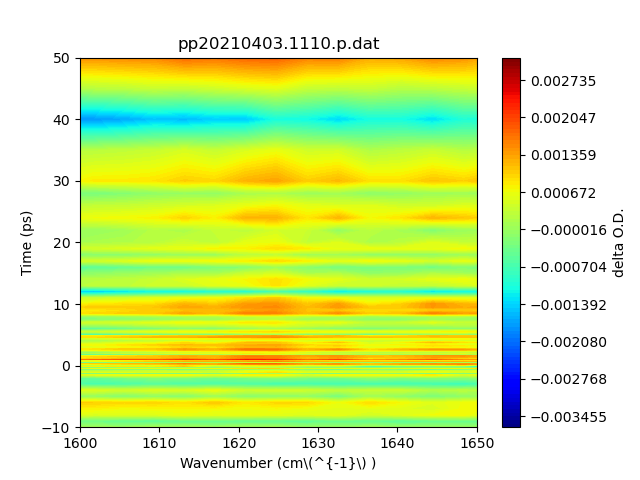

savename: ./temp/pp20210403.1110.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1111.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1111.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1112.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


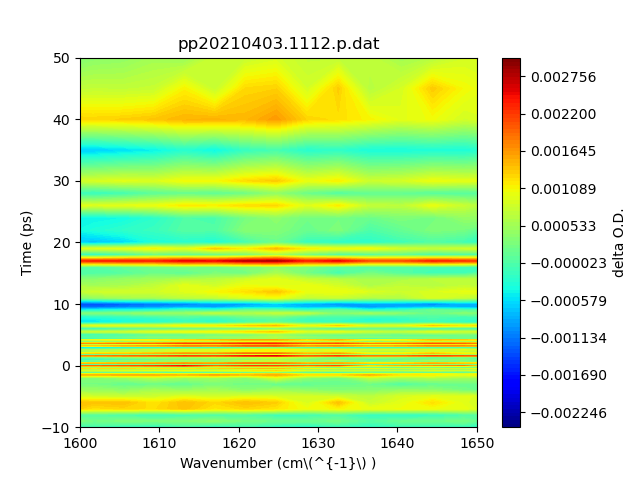

savename: ./temp/pp20210403.1112.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1113.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1113.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1114.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


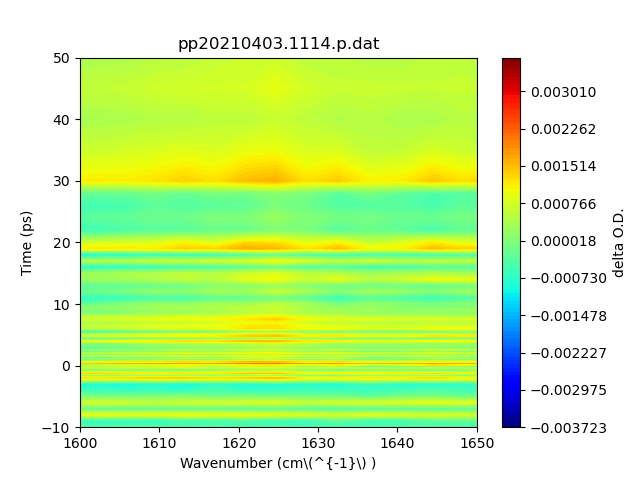

savename: ./temp/pp20210403.1114.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1115.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


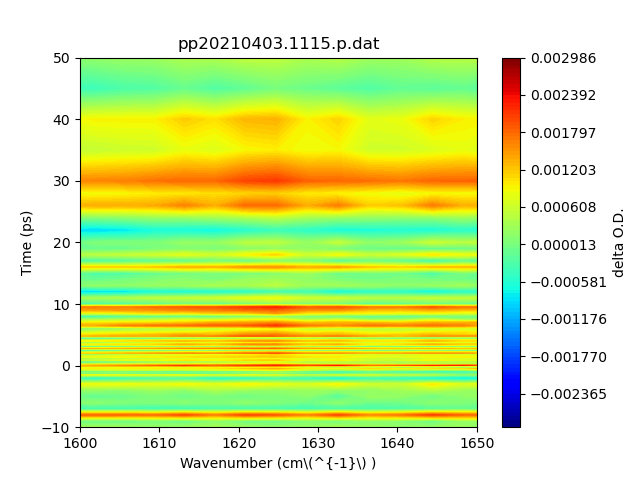

savename: ./temp/pp20210403.1115.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1116.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1116.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1117.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


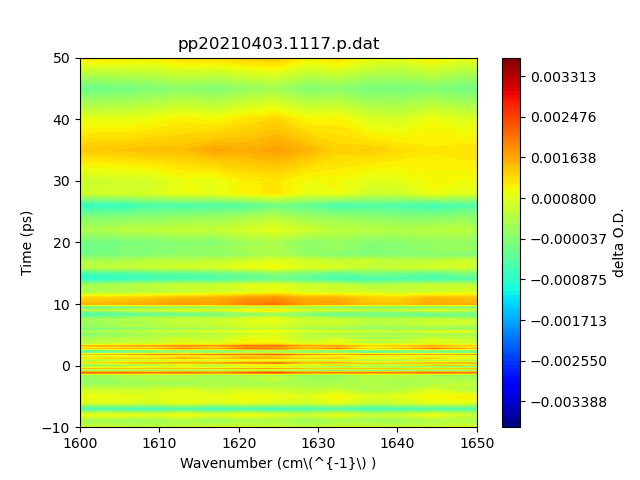

savename: ./temp/pp20210403.1117.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1118.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1118.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1119.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1119.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1120.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


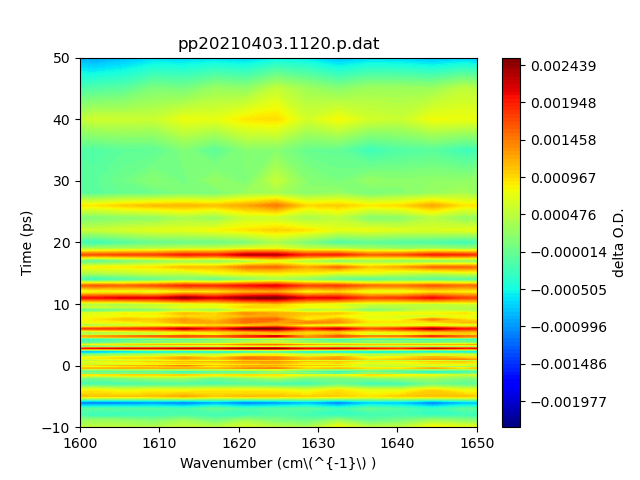

savename: ./temp/pp20210403.1120.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1121.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


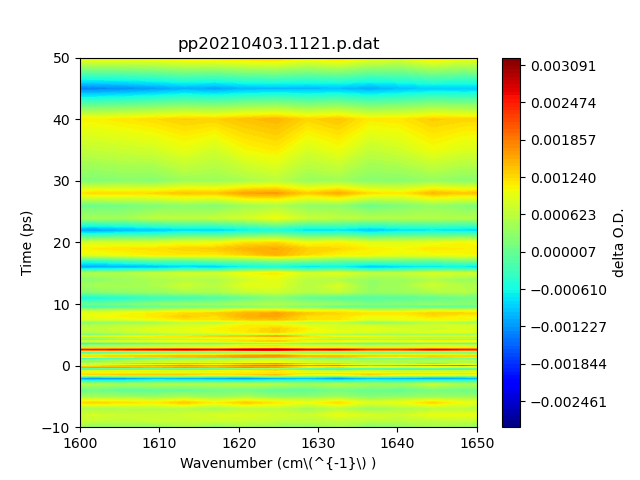

savename: ./temp/pp20210403.1121.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1122.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1122.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1123.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1123.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1124.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


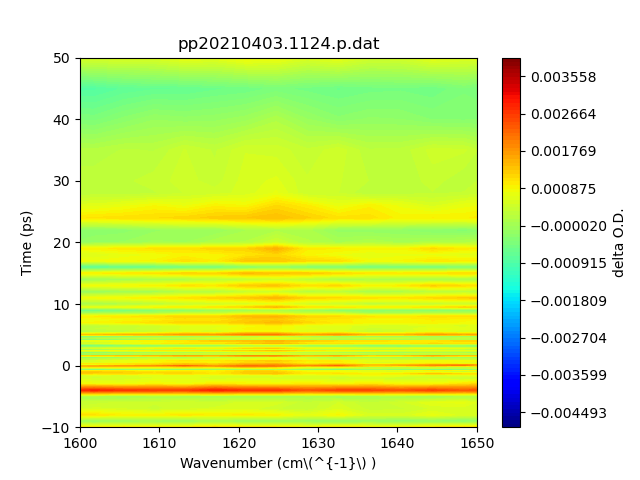

savename: ./temp/pp20210403.1124.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1125.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1125.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1126.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1126.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1127.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1127.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1128.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


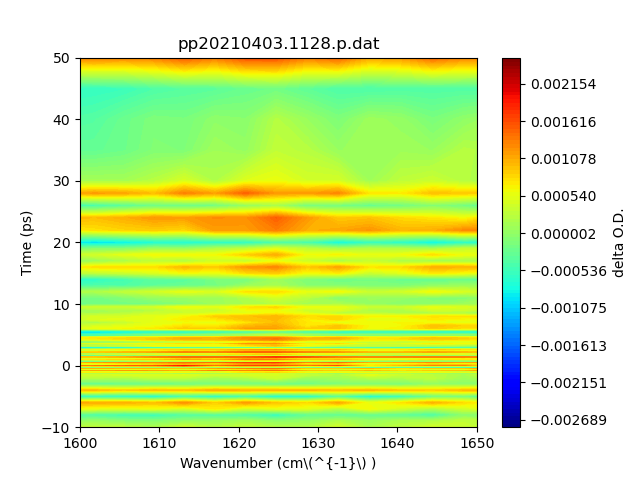

savename: ./temp/pp20210403.1128.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1129.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1129.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1130.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1130.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1131.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1131.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1132.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>


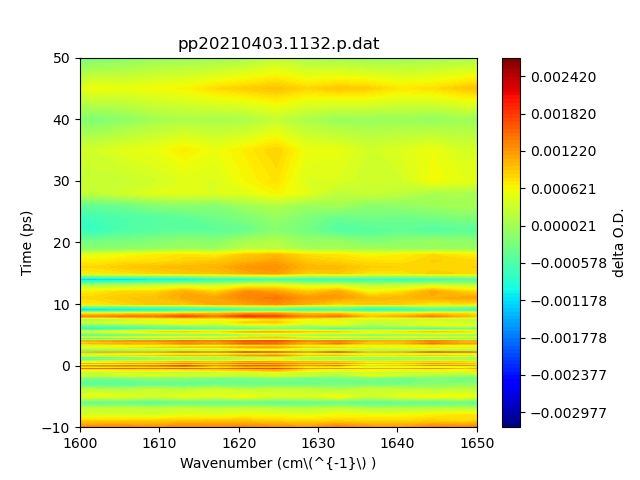

savename: ./temp/pp20210403.1132.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1133.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1133.p.dat.png
Processing ../PT1-PumpProbe/CCl4_Solution-100uW-1550cm-1/pp20210403.1134.p.dat
Raw data has shape (172, 65)
Found 64 wavenumbers: [1438.8 1441.9 1444.9 1448.  1451.1 1454.2 1457.3 1460.5 1463.6 1466.8
 1469.9 1473.1 1476.3 1479.6 1482.8 1486.  1489.3 1492.6 1495.9 1499.2
 1502.5 1505.8 1509.2 1512.5 1515.9 1519.3 1522.7 1526.1 1529.6 1533.
 1536.5 1540.  1543.5 1547.  1550.5 1554.1 1557.6 1561.2 1564.8 1568.4
 1572.1 1575.7 1579.4 1583.1 1586.8 1590.5 1594.2 1598.  1601.7 1605.5
 1609.3 1613.2 1617.  1620.9 1624.7 1628.6 1632.5 1636.5 1640.4 1644.4
 1648.4 1652.4 1656.4 1660.5]
Found 171 times: [-100.   -80.   -60.   -50.   -45.   -40.   -38.   -36.   -34.   -32.
  -30.   -28.   -26.   -24.   -22.   -20.   -19.   -18.   -17.   -16.
  -15.   -14.   -13.   -12.   -11.   -10.    -9.    -8.    -7.    -6.
   -5.    -4.    -3.    -2.    -1.5   -1.3   -1.1   -0.9   -0.8   -0.7
   -0.6   -0.5   -0.4   -0.3   -0.3   -0.2   -0.1   -0.1   -0.1    0.
    

<IPython.core.display.Javascript object>

savename: ./temp/pp20210403.1134.p.dat.png


In [5]:
# set plot details

# calculate the number of pictures

# fig.subplots_adjust(hspace=0.5)
# ax = _axs.flatten()

# fig.suptitle(suptitle, fontweight='bold')

# images = []

for i, item in enumerate(meta):
    filepath = item['filepath']
    vs, ts, data, dmax, dmin = parse_pp_data(filepath)
    fig, ax = plt.subplots()
    ax.set(xlabel='Wavenumber (cm\(^{-1}\) )', 
       ylabel='Time (ps)',
       title= item['imgtitle'])
    ax.set(xlim=(1600, 1650), ylim=(-10, 50))
    cbar_step = (dmax-dmin)/100
    levels = np.arange(dmin, dmax, (dmax-dmin)/100)
    im = ax.contourf(vs, ts, data, levels=levels, cmap='jet')
    fig.colorbar(im, ax=ax, orientation='vertical', label='delta O.D.')
    savename = './temp/' + item['imgtitle'] + '.png'
    print('savename:', savename)
    fig.savefig(savename)